In [9]:
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import davies_bouldin_score, silhouette_score
from sklearn.cluster import KMeans
import plotly.express as px

In [10]:
rfm = pd.read_csv("./../data/cleaned/rfm.csv")

In [11]:
# Preparation for KMeans

scaler = StandardScaler()
kmeans_customers = rfm[["recency", "frequency", "monetary"]].copy()

scaler.fit(kmeans_customers)

scaled_customers = scaler.transform(kmeans_customers)

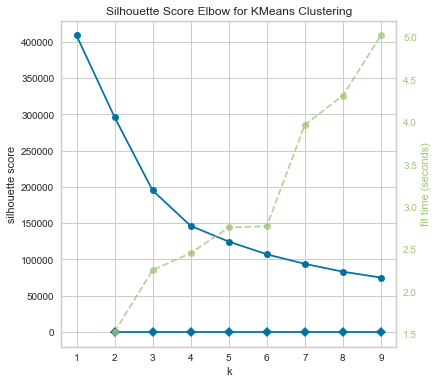

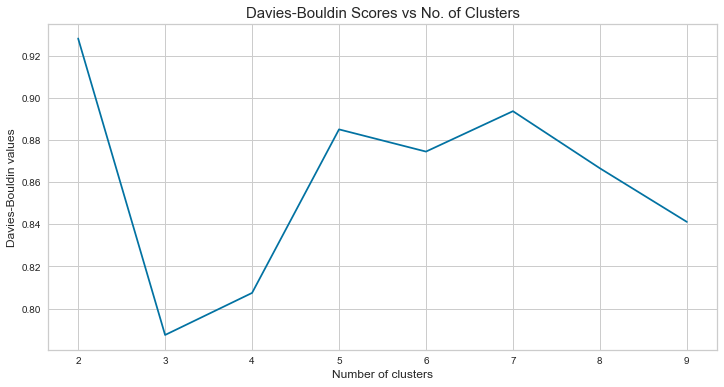

In [12]:
# Run the Kmeans algorithm and get the index of data points clusters
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(scaled_customers)
    sse.append(km.inertia_)

# Plot sse against k
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, "-o")
plt.xlabel(r"Number of clusters *k*")
plt.ylabel("Sum of squared distance");

kmeans = KMeans()
visualizer = KElbowVisualizer(
    kmeans, k=(2, 10), metric="silhouette", locate_elbow=False
)
# Fit the data and visualize
visualizer.fit(scaled_customers)
visualizer.show();

db_scores = {}

for k in range(2, 10):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(scaled_customers)
    labels = kmeans.labels_
    db_scores[k] = davies_bouldin_score(scaled_customers, labels)

# Plotting Davies-Bouldin Scores
plt.figure(figsize=(12, 6))
plt.plot(list(db_scores.keys()), list(db_scores.values()))
plt.xlabel("Number of clusters", fontsize=12)
plt.ylabel("Davies-Bouldin values", fontsize=12)
plt.title("Davies-Bouldin Scores vs No. of Clusters", fontsize=15)
plt.show()

In [13]:
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(scaled_customers)

clusters = kmeans.labels_

rfm["kmeans_cluster"] = clusters
rfm.kmeans_cluster = rfm.kmeans_cluster.astype("category")

scatter_3d = px.scatter_3d(
    rfm, x="recency", y="monetary", z="frequency", color="kmeans_cluster", opacity=0.7
)
scatter_3d.show()

In [14]:
pairplot = px.scatter_matrix(rfm,
    dimensions=["recency", "frequency", "monetary"],
    color="kmeans_cluster",
    opacity=0.7)
pairplot.update_traces(diagonal_visible=False)
pairplot.show()

In [15]:
print(rfm.kmeans_cluster.value_counts())
print(silhouette_score(scaled_customers, rfm.kmeans_cluster))

0    75171
1    59184
2     1960
Name: kmeans_cluster, dtype: int64
0.4726606764567427


In [16]:
rfm.to_csv('./../data/clustered/rfm.csv', index=False)